# Experiments with the T2W-MRI dataset

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import plotly.plotly as py
from plotly.graph_objs import *
py.sign_in('glemaitre', 'se04g0bmi2')

import mpld3

import numpy as np

from scipy.stats import norm,rayleigh,rice
from scipy.optimize import curve_fit

## Read the data

In [2]:
from scipy.io import loadmat

matfiles = loadmat('../data/raw/all_voxels.mat');

data = np.asmatrix(matfiles['data'])
data = data.astype(float)
label = np.ravel(matfiles['label'])
patient_sizes = np.ravel(matfiles['patient_sizes'])

Extract only the T2W data.

In [3]:
data_t2w = np.ravel(data[:, 2])

## Histogram visualisation

Class to handle each patient data.

In [4]:
class Patient(object):
    def __init__(self, data, label):
        self.data = data.copy()
        self.pdf, self.bin_edges = np.histogram(self.data, bins = (np.max(self.data) - np.min(self.data)), density=True)
        
        self.data_cancer = self.data[np.nonzero(label==1)]
        self.min_cap = int(np.min(self.data_cancer))
        self.max_cap = int(np.max(self.data_cancer))
        self.pdf_cap, self.bin_edges_cap = np.histogram(self.data_cancer, bins = (self.max_cap - self.min_cap), density=False)
        self.pdf_cap = np.divide(self.pdf_cap, float(len(label)))
        self.data_norm = data.copy()
        
        self.max_int = int(np.max(self.data))
        self.min_int = int(np.min(self.data))
        
        self.mean_data = np.mean(self.data)
        self.std_data = np.std(self.data)
        
        self.rayleigh_params = rayleigh.fit(self.data)
        self.gaussian_params = norm.fit(self.data)
        #self.rice_params = rice.fit(self.data)

Extract data for each patient.

In [5]:
#Build an histogram for each patient
patient_list = [];
for pt in range(np.size(patient_sizes)):

    if (pt == 0):
        start_idx = 0
        end_idx = patient_sizes[pt]
    else:
        start_idx = np.sum(patient_sizes[0 : pt])
        end_idx = np.sum(patient_sizes[0 : pt + 1])
        
    # Create the patient data
    patient_list.append(Patient(data_t2w[start_idx : end_idx], label[start_idx : end_idx]))

Create a heat map. Combine all the histograms properly.

In [6]:
heatmap_z_raw = np.asmatrix(np.zeros((np.size(patient_list), int(np.max(data_t2w)))));
heatmap_z_raw_cap = np.asmatrix(np.zeros((np.size(patient_list), int(np.max(data_t2w)))));

heatmap_y = []
for pt in range (np.size(patient_list)):
    str_pt = 'Pt ' + str(pt) + ' '
    heatmap_y.append(str_pt)
    heatmap_z_raw[pt, range(patient_list[pt].min_int, patient_list[pt].max_int)] = patient_list[pt].pdf[:]
    heatmap_z_raw_cap[pt, range(patient_list[pt].min_cap, patient_list[pt].max_cap)] = patient_list[pt].pdf_cap[:]
    
plot_data = Data([Heatmap(z=heatmap_z_raw, y=heatmap_y, colorscale='Jet')])
#layout = Layout(margin=Margin(l=0, r=0, b=0, t=0))

# Define a figure
fig = Figure(data=plot_data)
py.iplot(fig, filename='heatmap-t2w')

## Histogram visualisation - Rayleigh distribution

### Fitting on data

We can observed the same data by fitting a Rayleigh distribution.

In [7]:
heatmap_z_rayleigh = np.asmatrix(np.zeros((np.size(patient_list), int(np.max(data_t2w)))))

heatmap_y = []
for pt in range (np.size(patient_list)):
    str_pt = 'Pt ' + str(pt) + ' '
    heatmap_y.append(str_pt)
    heatmap_z_rayleigh[pt, :] = rayleigh.pdf(range(int(np.max(data_t2w))), \
                                    loc=patient_list[pt].rayleigh_params[0], \
                                    scale=patient_list[pt].rayleigh_params[1])
    
plot_data = Data([Heatmap(z=heatmap_z_rayleigh, y=heatmap_y, colorscale='Jet')])
#layout = Layout(margin=Margin(l=0, r=0, b=0, t=0))

# Define a figure
fig = Figure(data=plot_data)
py.iplot(fig, filename='heatmap-t2w-fitted')

## Histogram visualisation - Normal distribution

We can observed the same data by fitting a Normal distribution.

In [8]:
heatmap_z_gaussian = np.asmatrix(np.zeros((np.size(patient_list), int(np.max(data_t2w)))));

heatmap_y = []
for pt in range (np.size(patient_list)):
    str_pt = 'Pt ' + str(pt) + ' '
    heatmap_y.append(str_pt)
    heatmap_z_gaussian[pt, :] = norm.pdf(range(int(np.max(data_t2w))), \
                                    loc=patient_list[pt].gaussian_params[0], \
                                    scale=patient_list[pt].gaussian_params[1])
    
plot_data = Data([Heatmap(z=heatmap_z_gaussian, y=heatmap_y, colorscale='Jet')])
#layout = Layout(margin=Margin(l=0, r=0, b=0, t=0))

# Define a figure
fig = Figure(data=plot_data)
py.iplot(fig, filename='heatmap-t2w-fitted')

## Histogram visualisation - Rice distribution

Define the Rice distribution

The paremeters which will be optimised are the following:

* The amplitude a
* The start of the curve b
* The mean loc
* the standard deviation sca

# Normalize the data by fitting a rice function

Data normalization can be done using parametric distributions. For a given distribution, the data of every sample (image in this case) is used to determine the best fitting parameters. If all the samples were lying on the same plane, the fitted parameters should be quite similar. 

To force this, the parametric distribution is fitted to each sample and then all the sample parameters are forced to be equal.

For MRI rice distribution should be used: http://www.ncbi.nlm.nih.gov/pmc/articles/PMC2254141/

The rice function ... bla bla starts like Rayleigh and ends up like a gaussian.

![riceWikiImg](http://upload.wikimedia.org/wikipedia/commons/a/a0/Rice_distributiona_PDF.png)

## Normalization procedure

0. Ensure that all the patients historgrams have the same amound of beams
1. Fit a Rice to the patient.pdf
2. Modify the patient data:

    * Patient offset
    * Fitted mean alignment
    * Fitted width alignment

In [9]:
from collections import namedtuple
def myRice(x, factor, v, shift, std):
    return factor * rice.pdf(x, v, shift, std)

riceParameters = namedtuple('riceParameters',
                            ['factor', 'v', 'shift', 'std'])

#### Normalization Procedure (1. All patients with equal num. of beams)

In [10]:
## Remake the patients histograms
# Notice that all the bims for all the patients have the same size
db_min_intensity = min([p.min_int for p in patient_list])
db_max_intensity = max([p.max_int for p in patient_list])

#xx = [np.zeros((p.min_int)-db_min_intensity) for p in patient_list]
#pp = [p.pdf for p in patient_list]
#yy = [len(p.pdf)+p.min_int for p in patient_list]
#
#[(p.min_int, len(p.pdf), len(p.pdf)+p.min_int) for p in patient_list]
   
## Remake the patients histograms
# Notice that all the bims for all the patients have the same size
# (USING PREVIOUSLY COMPUTED STUFF)
for ind, patient in enumerate(patient_list):
    patient.pdf = np.squeeze(np.asarray(heatmap_z_raw[ind,:]))
    patient.pdf_cap = np.squeeze(np.asarray(heatmap_z_raw_cap[ind,:]))
    patient.bin_edges = np.array(range(db_max_intensity))
    patient.bin_edges_cap = np.array(range(db_max_intensity))

#### Normalization Procedure 2. (Fit a rice distribution)

In [11]:
# Obtine rice Fitting parameters
def get_rice_initial_parameters(patient):
    v = patient.gaussian_params[0]/db_max_intensity
    std = patient.gaussian_params[1]/db_max_intensity
    loc = np.float64(patient.min_int)/db_max_intensity
    factor = max(patient.pdf)/norm.pdf(v, v, std)
    return riceParameters(factor, v, loc, std)

rice_init = [get_rice_initial_parameters(p) for p in patient_list]
rice_fitted_param = []
rice_fiting_error = []
for patient, param0 in zip(patient_list, rice_init):
    popt, pcov = curve_fit(myRice,
                           np.linspace(0, 1., len(patient.pdf)),
                           patient.pdf,
                           p0=(param0.factor, param0.v,
                               param0.shift, param0.std))
    rice_fitted_param.append(riceParameters(popt[0], popt[1], popt[2], popt[3],))
    rice_fiting_error.append(pcov)    


    initialization 		 fitted
factor: 0.00109621763296 ---> factor:0.000783230088098
v: 0.219879870607        ---> v:1.47731365462
shift: 0.0               ---> shift:0.0741930073071
std: 0.0785287113721     ---> std:0.0742307073793



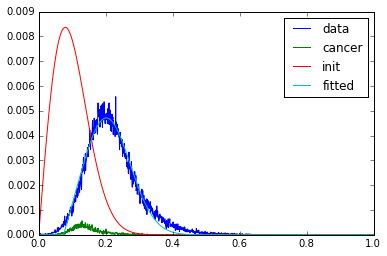


    initialization 		 fitted
factor: 0.00136550861396 ---> factor:0.000747724206801
v: 0.160266893907        ---> v:2.54805042698
shift: 0.0               ---> shift:0.0523753495545
std: 0.0529762346913     ---> std:0.0348863129844



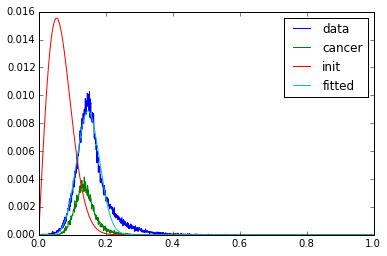


    initialization 		 fitted
factor: 0.001152983089   ---> factor:0.000772695108602
v: 0.222713820098        ---> v:1.85283727834
shift: 0.0               ---> shift:0.0746084396786
std: 0.0766710452023     ---> std:0.0635112325657



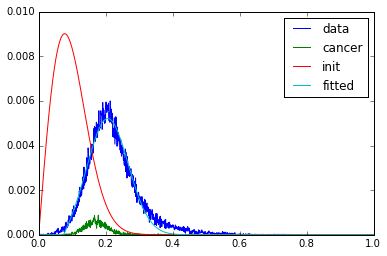


    initialization 		 fitted
factor: 0.000928484954197 ---> factor:0.000823636160458
v: 0.227665329623        ---> v:252.026317242
shift: 0.0164744645799   ---> shift:-13.9928989447
std: 0.0579270200932     ---> std:0.0564185085646



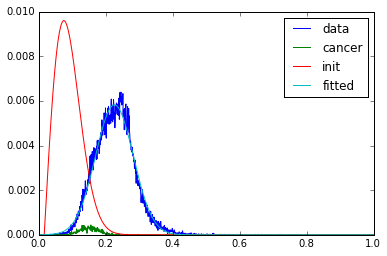


    initialization 		 fitted
factor: 0.00122172176388 ---> factor:0.000767067156776
v: 0.309981796503        ---> v:0.00110606698789
shift: 0.0               ---> shift:0.0580444297837
std: 0.151965812411      ---> std:0.183477328634



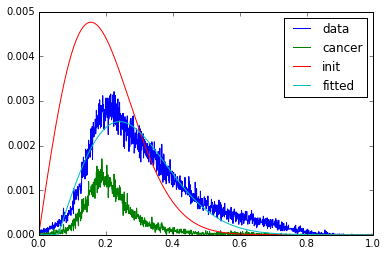


    initialization 		 fitted
factor: 0.00126436626935 ---> factor:0.000755935567832
v: 0.23000557152         ---> v:0.00772064975081
shift: 0.0               ---> shift:0.107746111379
std: 0.0765904635489     ---> std:0.0886777773326



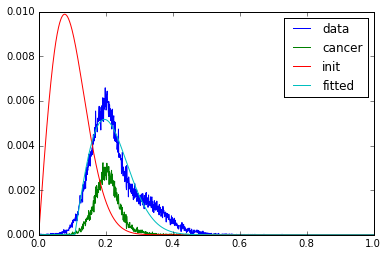


    initialization 		 fitted
factor: 0.00196499886311 ---> factor:0.000645536534327
v: 0.324427102426        ---> v:0.0143102591167
shift: 0.0               ---> shift:0.107461091426
std: 0.164430600549      ---> std:0.118385111946



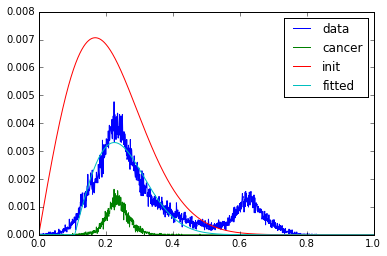


    initialization 		 fitted
factor: 0.00120929410191 ---> factor:0.000766266568295
v: 0.297680137819        ---> v:0.00865064053006
shift: 0.0107084019769   ---> shift:0.0945473293651
std: 0.119410179369      ---> std:0.144854487131



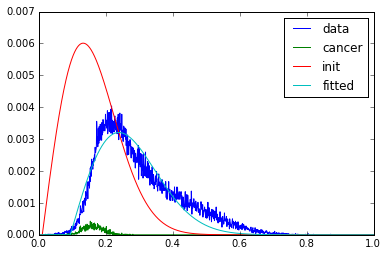


    initialization 		 fitted
factor: 0.00127230656442 ---> factor:0.00076891676626
v: 0.239124902931        ---> v:0.00866079637098
shift: 0.0               ---> shift:0.0456565659749
std: 0.115219952255      ---> std:0.143095781378



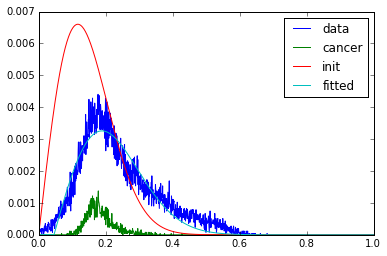


    initialization 		 fitted
factor: 0.00123233877905 ---> factor:0.000783086192902
v: 0.230280403717        ---> v:0.0118001297654
shift: 0.0               ---> shift:0.0745159406499
std: 0.0927401719306     ---> std:0.120605152873



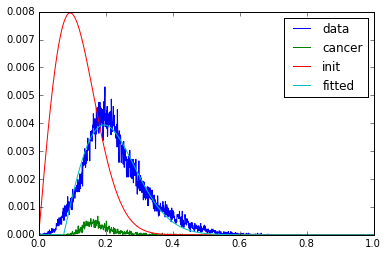


    initialization 		 fitted
factor: 0.00117431486152 ---> factor:0.000804092337143
v: 0.252577853756        ---> v:0.0120742304154
shift: 0.0238879736409   ---> shift:0.0813110296376
std: 0.0925091221008     ---> std:0.13172022879



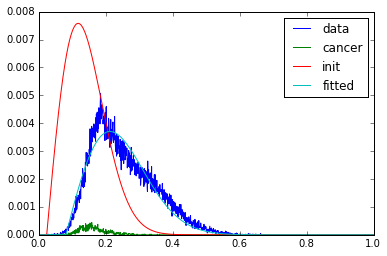


    initialization 		 fitted
factor: 0.0012977579164  ---> factor:0.000741583030996
v: 0.244242286732        ---> v:0.0040040825966
shift: 0.00411861614498  ---> shift:0.0703077205766
std: 0.106889881907      ---> std:0.117567711486



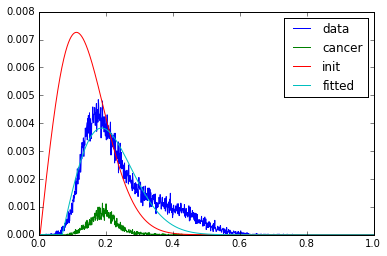


    initialization 		 fitted
factor: 0.0012445742875  ---> factor:0.000767733894691
v: 0.179916691436        ---> v:0.00708492257033
shift: 0.0               ---> shift:0.0475112239413
std: 0.0776954658269     ---> std:0.0962090431868



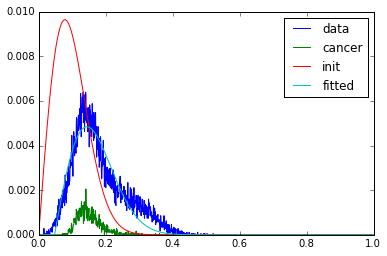


    initialization 		 fitted
factor: 0.00113872998431 ---> factor:0.00077988371298
v: 0.268054490657        ---> v:0.00389130314176
shift: 0.0329489291598   ---> shift:0.135687375465
std: 0.0806419978049     ---> std:0.100960999167



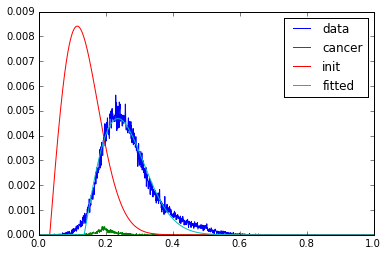


    initialization 		 fitted
factor: 0.00173156397331 ---> factor:0.000680889367863
v: 0.261851655058        ---> v:0.00569166787266
shift: 0.0428336079077   ---> shift:0.15384363806
std: 0.0867216498131     ---> std:0.0635422742757



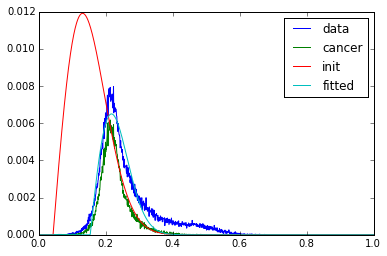


    initialization 		 fitted
factor: 0.00109726556161 ---> factor:0.000791573562947
v: 0.248073485744        ---> v:0.00547644475582
shift: 0.0321252059308   ---> shift:0.10506059789
std: 0.0828371941668     ---> std:0.108378674863



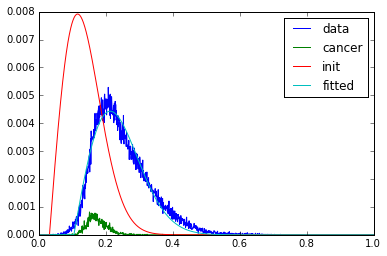


    initialization 		 fitted
factor: 0.00105144580263 ---> factor:0.000792043087146
v: 0.207443714736        ---> v:0.000747491487599
shift: 0.0               ---> shift:0.0987263229682
std: 0.0632121560429     ---> std:0.0855335477284



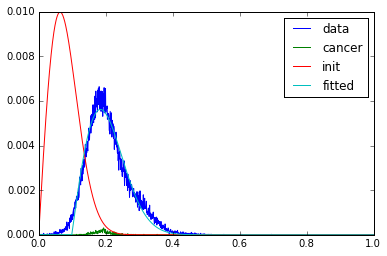

In [12]:
def output_msg(init, fitted):
    output_line = "{0:24s} ---> {1}:{2}\n"
    msg = "\n    initialization \t\t fitted\n"
    for param_name in riceParameters._fields:
        msg = msg+(output_line.format(
            param_name+': '+eval('"{0}".format(init.'+'{0:s}'.format(param_name)+')'),
            param_name,
            eval('"{0}".format(fitted.'+'{0:s}'.format(param_name)+')')))
    return msg

#selected_patients = range(len(patient_list))
#selected_patients = range(2)
for patient, p0, pFit, fitErr in zip(patient_list,
                                     rice_init,
                                     rice_fitted_param,
                                     rice_fiting_error):
    print output_msg(p0, pFit)
    #print fitErr
    plt.figure()
    x = np.linspace(0, 1., len(patient.pdf))
    plt.plot(x, patient.pdf, label='data')
    plt.plot(x, patient.pdf_cap, label='cancer')
    for p,l in zip((p0, pFit), ('init', 'fitted')):
        plt.plot(x, myRice(x, p.factor, p.v, p.shift, p.std), label=l)
    plt.legend()
    plt.show()
    

#### Normalization procedure 3. (modify the patient data)

In order to determine, the data transformation all the fitted distributions should be studied

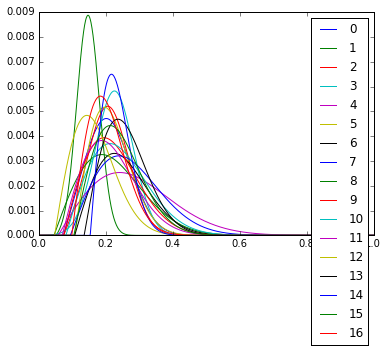

In [13]:
plt.figure()
for indx, param in enumerate(rice_fitted_param):
    x = np.linspace(0, 1., 1000)
    plt.plot(x,
             myRice(x, param.factor, param.v, param.shift, param.std),
             label=indx)
plt.legend()
plt.show()

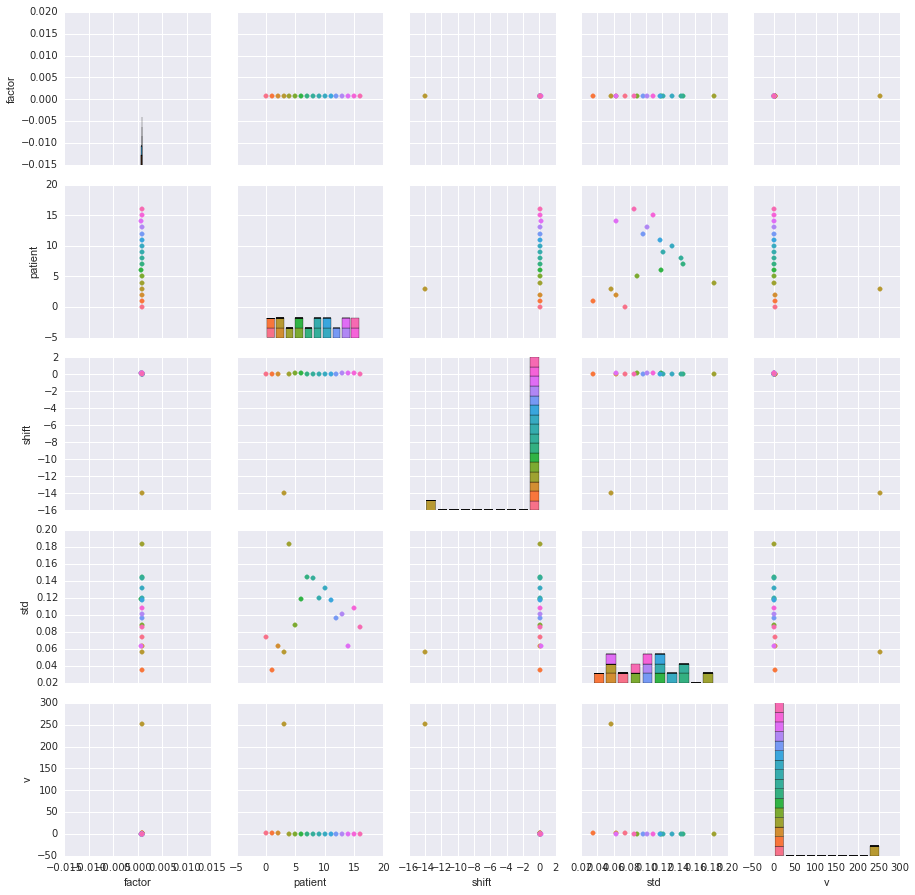

In [14]:
import pandas as pd
df = pd.DataFrame({'v' : [p.v for p in rice_fitted_param],
                   'factor' : [p.factor for p in rice_fitted_param],
                   'shift' : [p.shift for p in rice_fitted_param], 
                   'std' : [p.std for p in rice_fitted_param],
                   'patient' : range(len(rice_fitted_param))})
#                   'patient' : ['p{0:02d}'.format(p) for p in range(len(rice_fitted_param))]})
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib as mpl
import matplotlib.pyplot as plt

g = sns.PairGrid(df, hue="patient", size=2.5
                )
                 #vars=["factor", "shift", "v", "std"])
g.map_offdiag(plt.scatter)
g.map_diag(plt.hist)

Scales need to be worked out to see the variability otherwise only two groups are spotted. the almost gaussian and the raylengh

```
#axes = g.axes
#[[axes[ii,jj].get_xlim() for ii in range(4)] for jj in range(4)]
#axes[1,1].set_xlim(-0.005,0.005)
#axes.shape

g.add_legend(range(17))
```

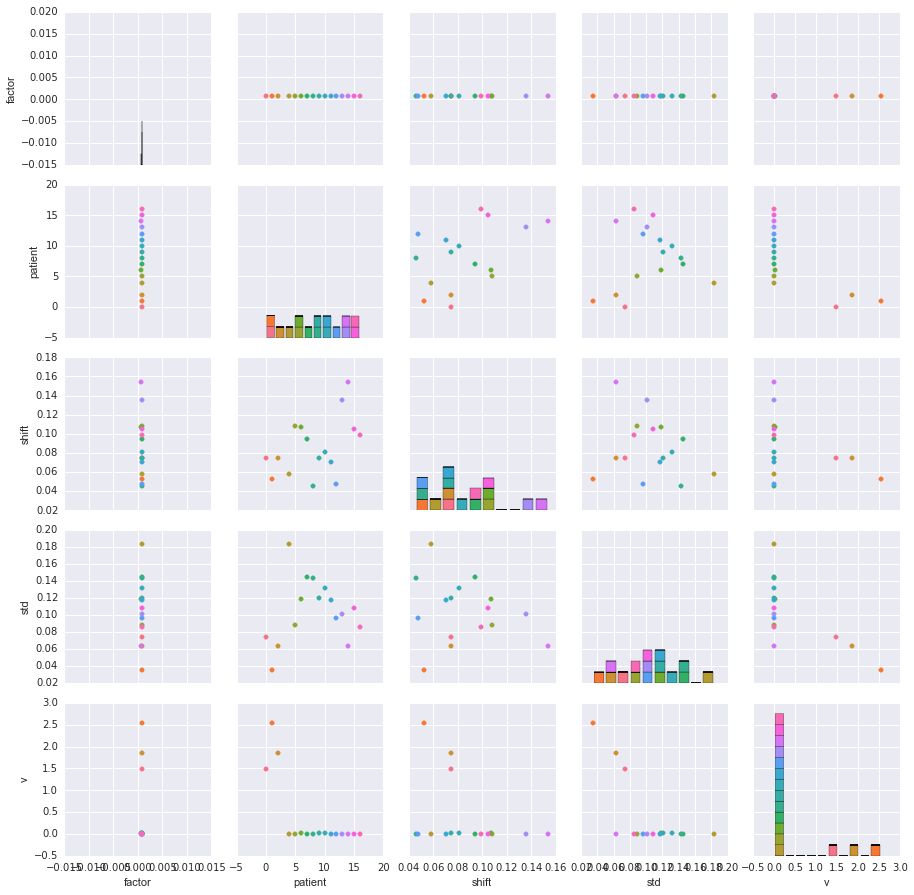

In [15]:
# Repeat without the Gaussian-alike distribution.
g = sns.PairGrid(df[df.patient!=3], hue="patient", size=2.5
                )
                 #vars=["factor", "shift", "v", "std"])
g.map_offdiag(plt.scatter)
g.map_diag(plt.hist)


take a look at the following realtions:

* shift-std
* patient-std
* v-(std/shift)

##### Bring all the parametric distributions under the same light

In [16]:
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(20,5))
for indx, param in enumerate(rice_fitted_param):
    ax[0].plot(np.linspace(0, 1., 1000),
                  myRice(np.linspace(0, 1., 1000), 
                         param.factor, param.v, param.shift, param.std),
                  label='Pt '+str(indx))
    ax[1].plot(np.linspace(-2, 8, 1000),
                  myRice(np.linspace(-2, 8, 1000) * param.std + 
                         rice.mean(b=param.v, loc=param.shift, scale=param.std),
                         factor=param.factor, 
                         v=param.v, 
                         shift=param.shift, 
                         std=param.std),
                  label='Pt '+str(indx))
    ax[2].plot(np.linspace(-2, 8, 1000),
                  myRice((np.linspace(-2, 8, 1000)+ 
                         rice.mean(b=param.v, loc=param.shift, scale=param.std))* param.std ,
                         factor=param.factor, 
                         v=param.v, 
                         shift=param.shift, 
                         std=param.std),
                  label='Pt '+str(indx))

ax[0].legend()


print """ The problem is that rice.mean returnes mu*Scale,
          Therefore, in graph 3 when (x+mu)*Scale is used all the distributions are
          shifted since (x*Scale) + (mu*Scale*Scale) is used insted"""

mpld3.display(fig)

 The problem is that rice.mean returnes mu*Scale,
          Therefore, in graph 3 when (x+mu)*Scale is used all the distributions are
          shifted since (x*Scale) + (mu*Scale*Scale) is used insted


Now that we know how to align the fitted models, we want to translate the data to the same light based on the alignment of its fitted models

riceParameters(factor=0.00078323008809779251, v=1.477313654617759, shift=0.074193007307073275, std=0.074230707379280003)
0.212137683137


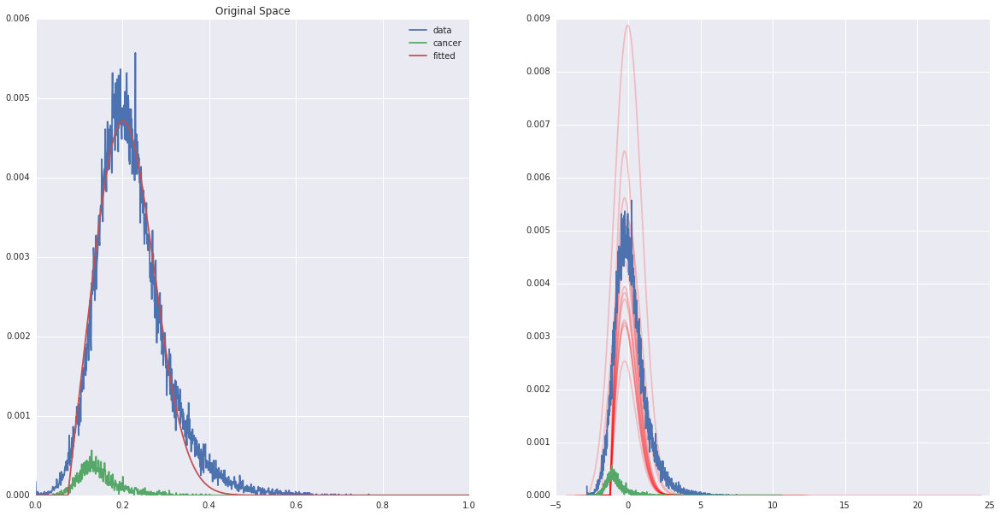

riceParameters(factor=0.00074772420680127452, v=2.5480504269815265, shift=0.052375349554538868, std=0.034886312984361352)
0.14847931019


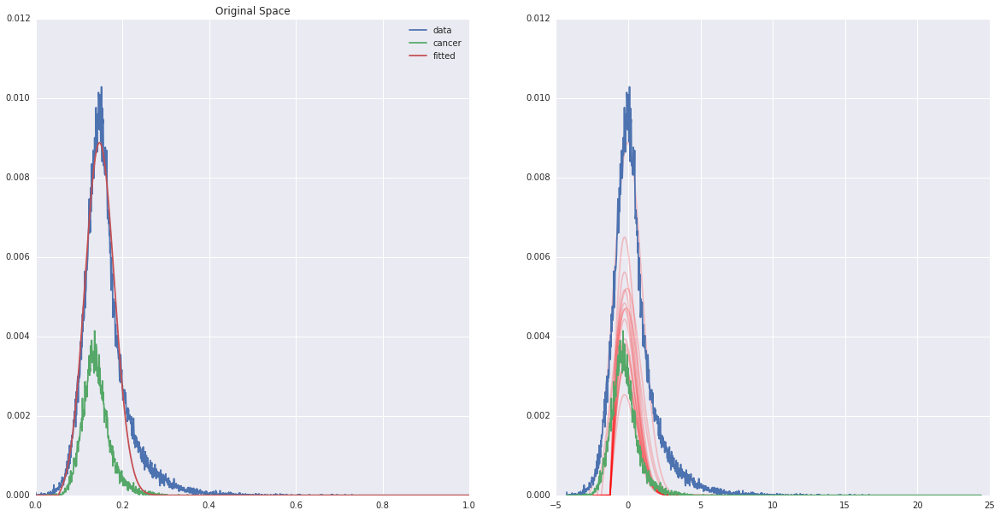

riceParameters(factor=0.00077269510860235118, v=1.8528372783390457, shift=0.074608439678591862, std=0.063511232565661463)
0.211156754831


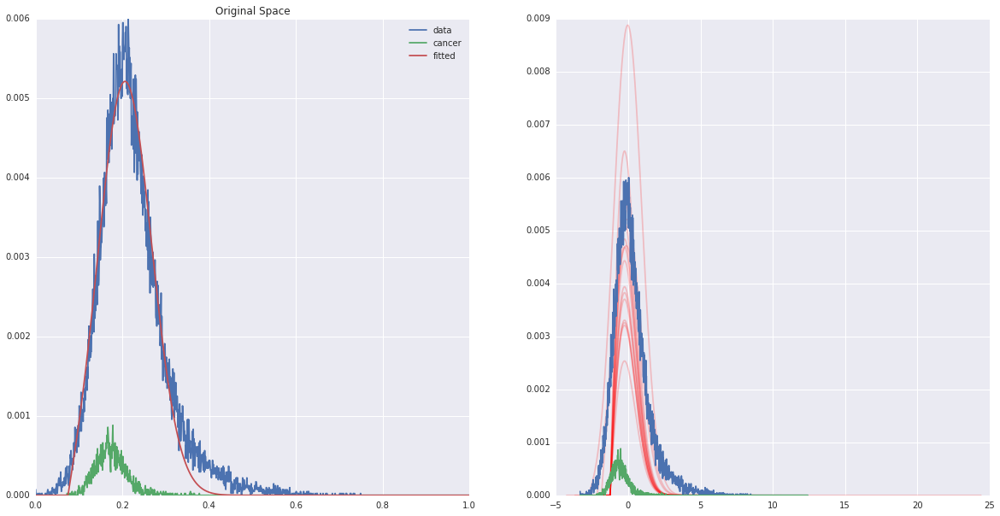

riceParameters(factor=0.00082363616045835677, v=252.02631724207845, shift=-13.992898944739892, std=0.05641850856459537)
nan


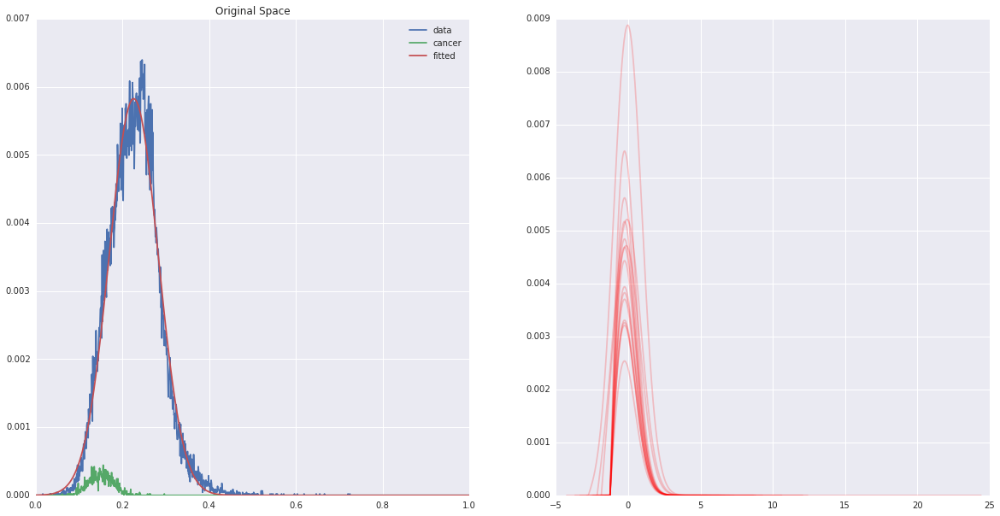

riceParameters(factor=0.00076706715677594766, v=0.001106066987892107, shift=0.058044429783691114, std=0.18347732863416097)
0.287999229969


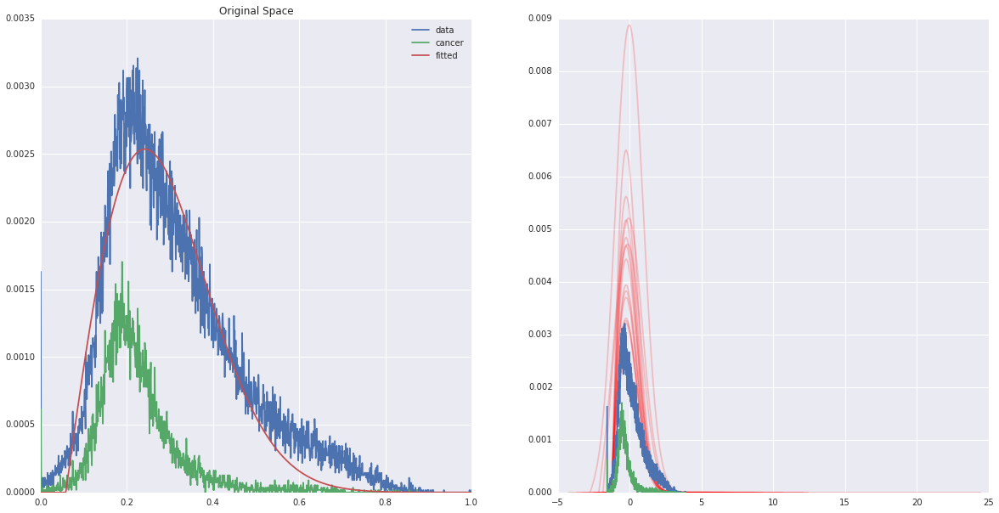

riceParameters(factor=0.00075593556783215186, v=0.0077206497508138091, shift=0.10774611137873502, std=0.088677777332557051)
0.218888879606


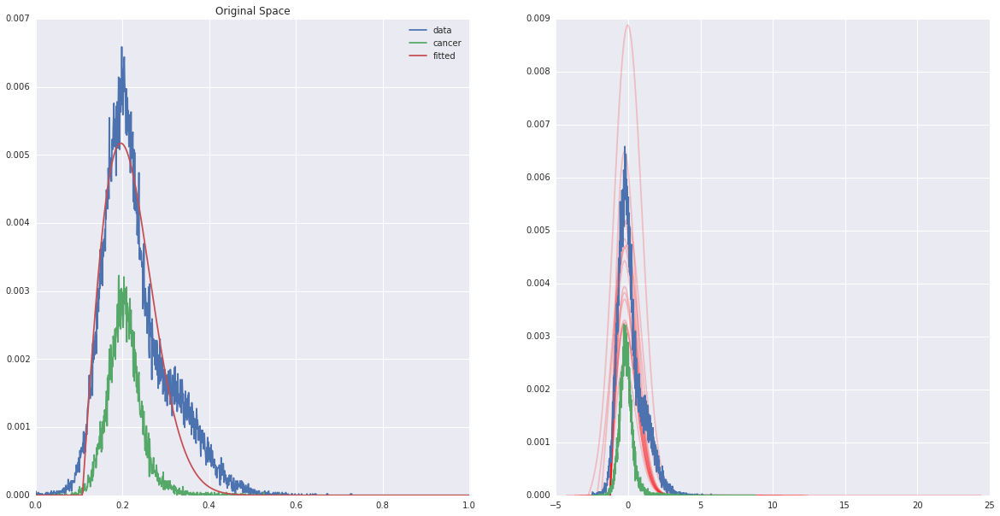

riceParameters(factor=0.00064553653432676246, v=0.01431025911672028, shift=0.10746109142580751, std=0.11838511194630257)
0.255842421902


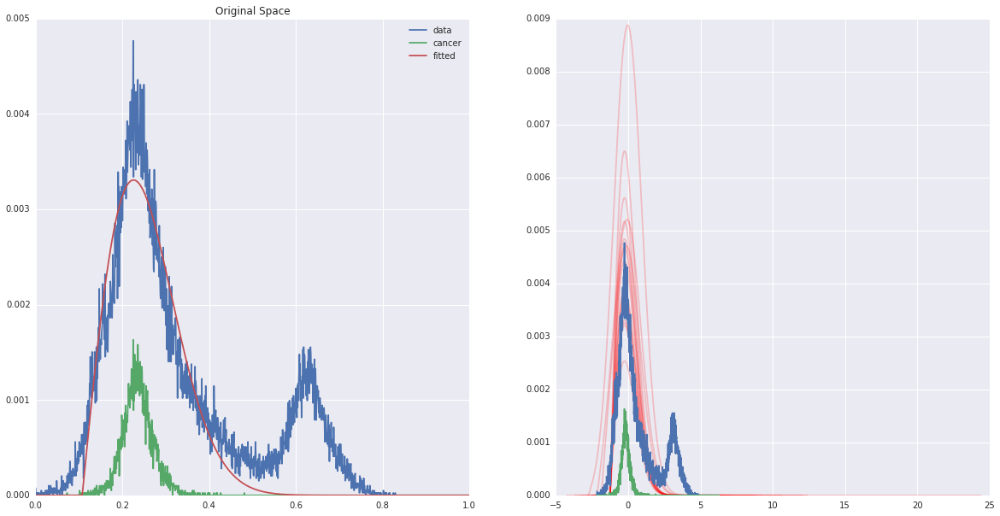

riceParameters(factor=0.00076626656829488612, v=0.008650640530064025, shift=0.094547329365083518, std=0.1448544871311794)
0.276098902399


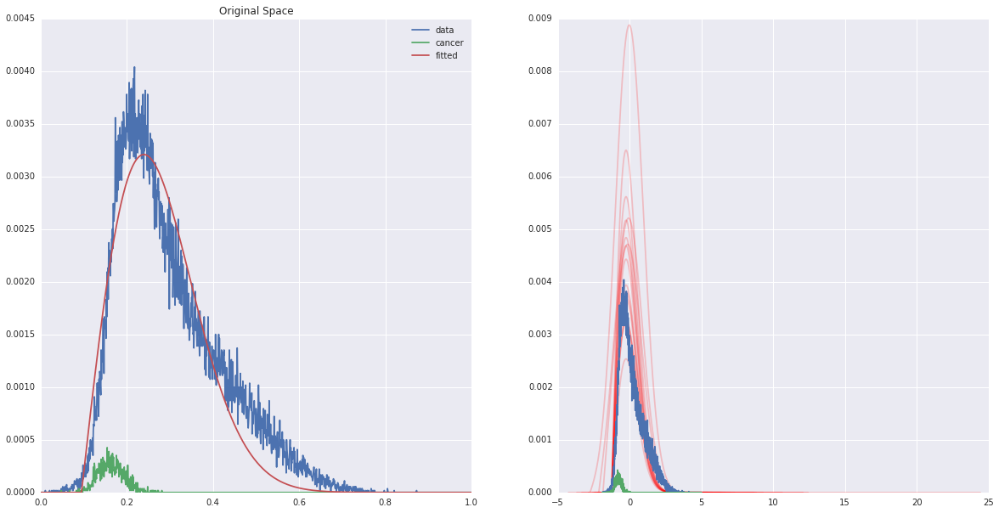

riceParameters(factor=0.00076891676626013696, v=0.0086607963709758682, shift=0.045656565974948861, std=0.14309578137838677)
0.225003894871


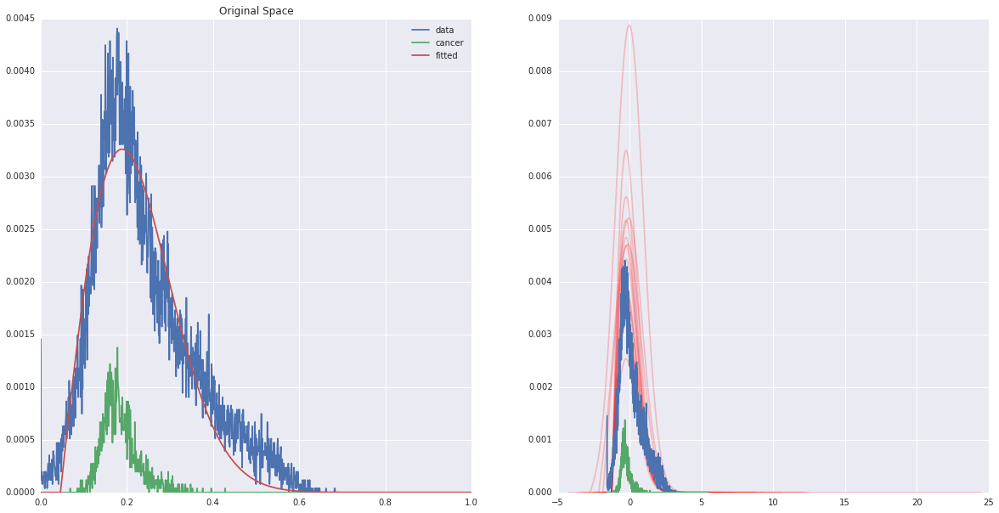

riceParameters(factor=0.00078308619290232671, v=0.011800129765442525, shift=0.074515940649892212, std=0.12060515287299292)
0.225677345594


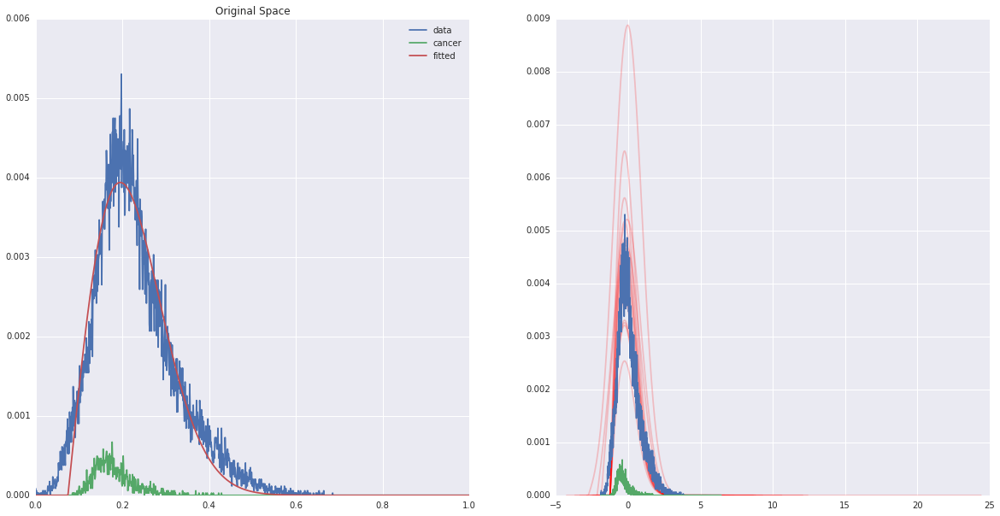

riceParameters(factor=0.0008040923371434443, v=0.012074230415379141, shift=0.081311029637629928, std=0.13172022879038028)
0.246403871376


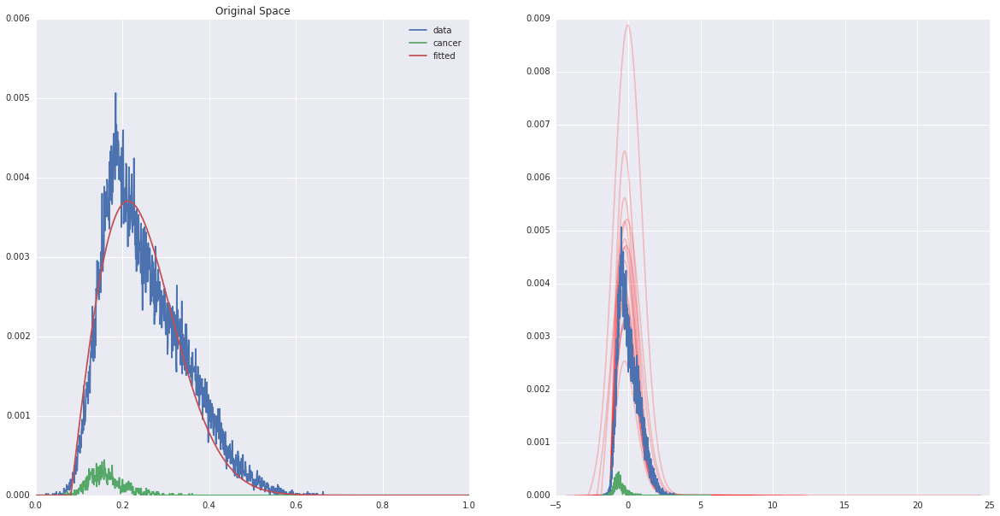

riceParameters(factor=0.00074158303099644389, v=0.0040040825966043232, shift=0.070307720576586338, std=0.11756771148646887)
0.217657586075


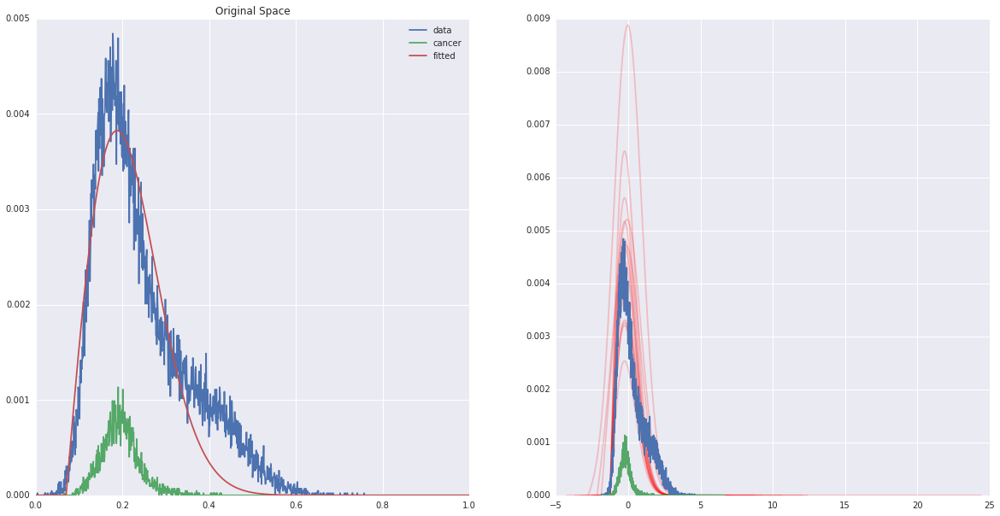

riceParameters(factor=0.00076773389469050087, v=0.0070849225703312506, shift=0.047511223941348865, std=0.096209043186828047)
0.168092891064


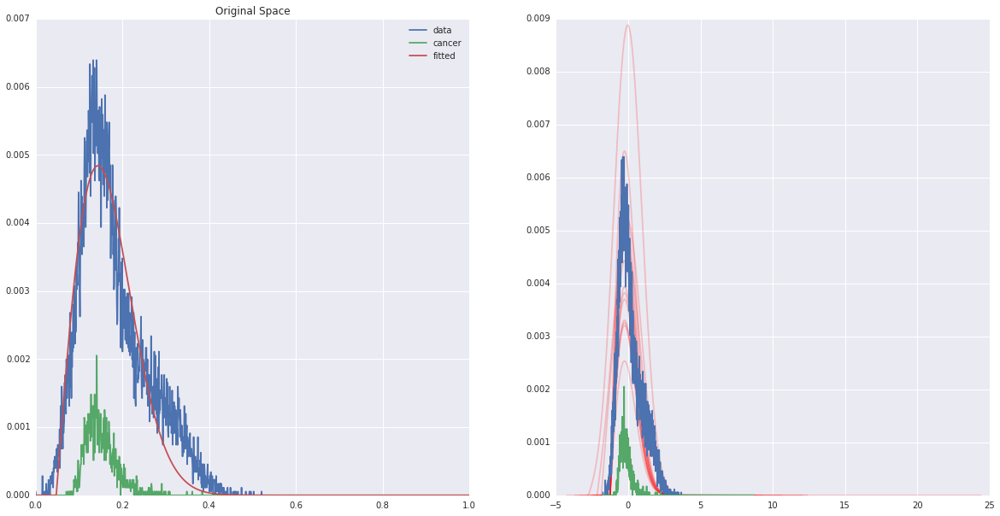

riceParameters(factor=0.000779883712979906, v=0.0038913031417607013, shift=0.13568737546487072, std=0.10096099916705761)
0.262223702047


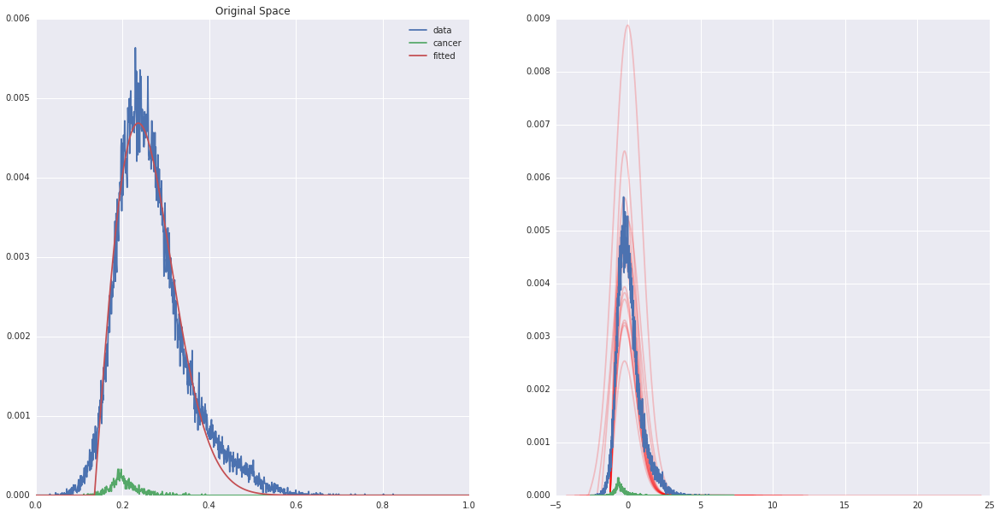

riceParameters(factor=0.00068088936786294817, v=0.0056916678726631744, shift=0.15384363806017207, std=0.063542274275696795)
0.233482713699


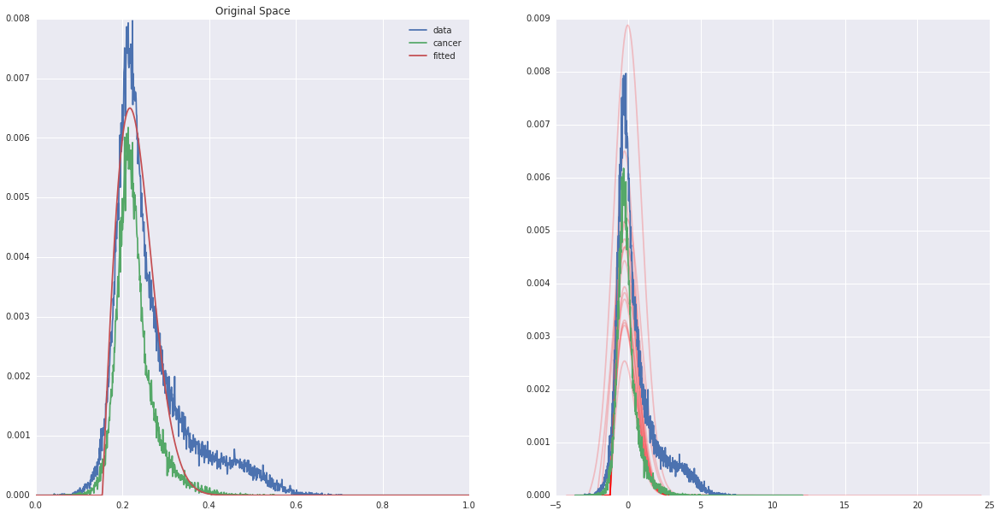

riceParameters(factor=0.00079157356294736673, v=0.0054764447558224641, shift=0.10506059788960111, std=0.10837867486336424)
0.240894141731


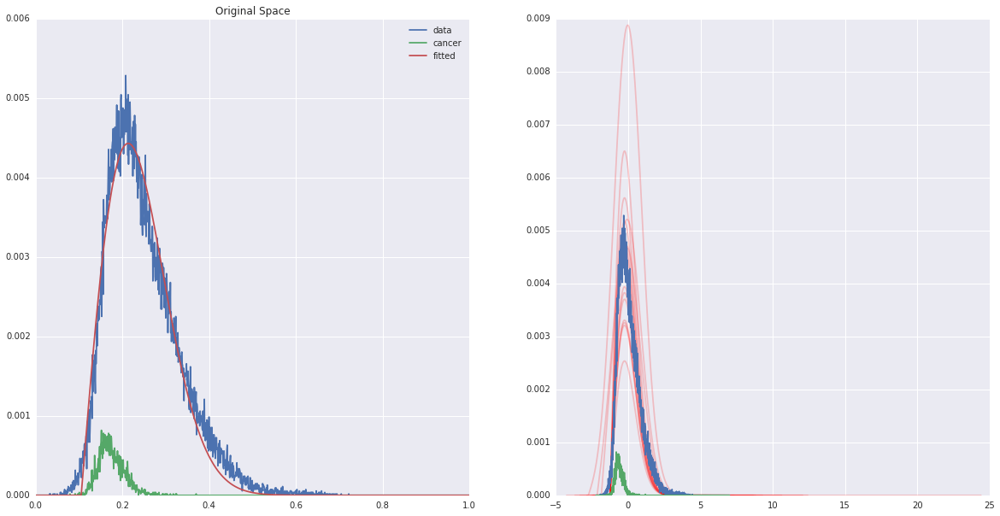

riceParameters(factor=0.00079204308714605055, v=0.00074749148759935486, shift=0.098726322968193989, std=0.085533547728359208)
0.205926742525


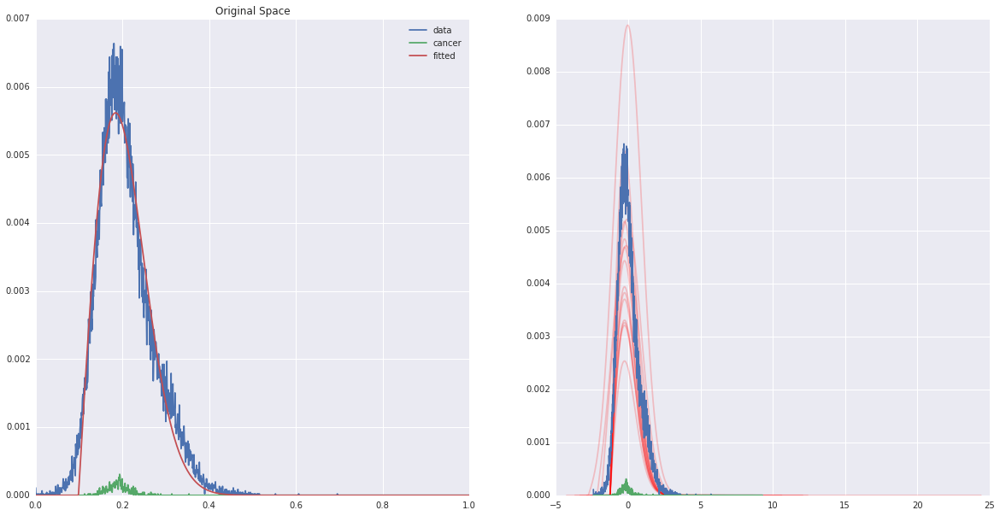

In [17]:
normalizing = lambda x,muS, S: (x-muS)/S
denormalizing = lambda x,muS, S: x*S+muS

for patient, pFit in zip(patient_list,
                         rice_fitted_param):
    # Poting the original Space
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
    x = np.linspace(0, 1., len(patient.pdf))
    ax[0].plot(x, patient.pdf, label='data')
    ax[0].plot(x, patient.pdf_cap, label='cancer')
    ax[0].plot(x, myRice(x, pFit.factor, pFit.v, pFit.shift, pFit.std), label='fitted')
    ax[0].set_title('Original Space')
    ax[0].legend()
    
    # Plotting the Normalized Space
    for indx, param in enumerate(rice_fitted_param):
        muS = rice.mean(b=param.v, loc=param.shift, scale=param.std)
        S = param.std
        x2 = (x-muS)/S
        ax[1].plot(x2,
                   myRice(x2*S+muS,
                          factor=param.factor, 
                          v=param.v, 
                          shift=param.shift, 
                          std=param.std),
                   color='r', alpha=0.2)
    # Ploting normalized PDF
    current_muS = rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std)
    current_S = pFit.std
    print pFit
    print current_muS
    ax[1].plot(normalizing(x, current_muS, current_S),patient.pdf)
    ax[1].plot(normalizing(x, current_muS, current_S),patient.pdf_cap)
    
    
    plt.show()
    
plt.figure()
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
for patient, pFit in zip(patient_list, rice_fitted_param):
    # Ploting normalized PDF
    current_muS = rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std)
    current_S = pFit.std
    #ax[0].plot(x, patient.pdf_cap, label='cancer')
    ax[0].plot(normalizing(x, current_muS, current_S),patient.pdf_cap)
    current_muS = norm.mean(loc=patient.gaussian_params[0], scale=patient.gaussian_params[1])/db_max_intensity
    current_S = patient.gaussian_params[1]/db_max_intensity
    ax[1].plot(normalizing(x, current_muS, current_S),patient.pdf_cap)
    
mpld3.display(fig)

plt.figure()
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
for patient, pFit in zip(patient_list, rice_fitted_param):
    # Ploting normalized PDF
    current_muS = rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std)
    current_S = pFit.std
    #ax[0].plot(x, patient.pdf_cap, label='cancer')
    ax[0].plot(normalizing(x, current_muS, current_S),myRice(x, pFit.factor, pFit.v, pFit.shift, pFit.std))
    current_muS = norm.mean(loc=patient.gaussian_params[0], scale=patient.gaussian_params[1])/db_max_intensity
    current_S = patient.gaussian_params[1]/db_max_intensity
    ax[1].plot(normalizing(x, current_muS, current_S), norm.pdf(x, current_muS, current_S))
    
mpld3.display(fig)


### Normalisation by parts

In [38]:
def find_percentile(data):
    # 2nd percentile
    p_0 = np.percentile(patient.data, 2)
    # 25th percentile
    p_25 = np.percentile(patient.data, 25)
    # 50th percentile
    p_50 = np.percentile(patient.data, 50)
    # 75th percentile
    p_75 = np.percentile(patient.data, 75)
    # 98th percentile
    p_100 = np.percentile(patient.data, 98)
    
    return (p_0, p_25, p_50, p_75, p_100)

def rescale_parts(org_data, res_data, lim_inf, lim_sup, t_inf, t_sup):
    # Find the index of interest on the original data
    idx = np.nonzero(np.bitwise_and(org_data >= lim_inf, org_data < lim_sup))
    print t_sup
    print t_inf
    # Rescale the data
    fac = np.divide(t_sup - t_inf, lim_sup - lim_inf)
    res_data[idx] =  t_inf + np.multiply((org_data[idx] - lim_inf), fac)
    
    return res_data

# First we have to detect the landmarks
pat_0 = []
pat_25 = []
pat_50 = []
pat_75 = []
pat_100 = []
for patient in patient_list:
    
    # Find the landmarks for the current patient
    p_0, p_25, p_50, p_75, p_100 = find_percentile(patient.data)
    
    # Append the data 
    pat_0.append(p_0)
    pat_25.append(p_25)
    pat_50.append(p_50)
    pat_75.append(p_75)
    pat_100.append(p_100)
    
# Compute the theoritical landmarks
tp_0 = np.mean(np.array(pat_0))
tp_25 = np.mean(np.array(pat_25))
tp_50 = np.mean(np.array(pat_50))
tp_75 = np.mean(np.array(pat_75))
tp_100 = np.mean(np.array(pat_100))

data_norm_parts = []
for patient in patient_list:
    # Find the landmarks for the current patient
    p_0, p_25, p_50, p_75, p_100 = find_percentile(patient.data)
    
    # Normalise the patient
    patient.data_norm_parts = patient.data.copy()
    
    # Normalise between 0 and 25
    patient.data_norm_parts = rescale_parts(patient.data, patient.data_norm_parts, p_0, p_25, tp_0, tp_25)
    # Normalise between 25 and 50
    patient.data_norm_parts = rescale_parts(patient.data, patient.data_norm_parts, p_25, p_50, tp_25, tp_50)
    # Normalise between 50 and 75
    patient.data_norm_parts = rescale_parts(patient.data, patient.data_norm_parts, p_50, p_75, tp_50, tp_75)
    # Normalise between 75 and 100
    patient.data_norm_parts = rescale_parts(patient.data, patient.data_norm_parts, p_75, p_100, tp_75, tp_100)
    # Normalise by the max
    patient.data_norm_parts = np.divide(patient.data_norm_parts, float(db_max_intensity))
    
    # Concatenate the patient
    data_norm_parts = np.concatenate((data_norm_parts, patient.data_norm_parts), axis=0)
    
# Normalise between -1. and 1.
data_norm_parts = (data_norm_parts - np.min(data_norm_parts)) * ((1. - (-1.)) / (np.max(data_norm_parts) - np.min(data_norm_parts))) - 1.

# Save the dataset normalised
np.save('../data/clean/data_norm_parts.npy',data_norm_parts)


215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.941176471
271.058823529
576.0
353.941176471
215.352941176
124.176470588
271.058823529
215.352941176
353.9411

### Normalise the input data

In [20]:
data_norm_rician = []
data_norm_gaussian = []
for patient, pFit in zip(patient_list, rice_fitted_param):
    ### Rician normalisation
    # Copy the original data
    patient.data_norm_rician = patient.data.copy()
    # Normalise the data depending on the maximum of the dataset
    patient.data_norm_rician = np.divide(patient.data_norm_rician, float(db_max_intensity))
    # Get the parameter to apply the Rician normalisation
    current_muS = rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std)
    current_S = pFit.std
    # Normalise the data
    patient.data_norm_rician = (patient.data_norm_rician - current_muS) / current_S
    # Concatenate the data
    data_norm_rician = np.concatenate((data_norm_rician, patient.data_norm_rician), axis=0)
    
    ### Gaussian normalisation
    # Copy the original data
    patient.data_norm_gaussian = patient.data.copy()
    # Normalise the data depending on the maximum of the dataset
    patient.data_norm_gaussian = np.divide(patient.data_norm_gaussian, float(db_max_intensity))
    # Get the parameter to apply the Gaussian normalisation
    current_muS = norm.mean(loc=patient.gaussian_params[0], scale=patient.gaussian_params[1])/db_max_intensity
    current_S = patient.gaussian_params[1]/db_max_intensity
    # Normalise the data
    patient.data_norm_gaussian = (patient.data_norm_gaussian - current_muS) / current_S
    # Concatenate the data
    data_norm_gaussian = np.concatenate((data_norm_gaussian, patient.data_norm_gaussian), axis=0)
    
# Normalise the data between -1 and 1
data_norm_rician = (data_norm_rician - np.min(data_norm_rician)) * ((1. - (-1.)) / (np.max(data_norm_rician) - np.min(data_norm_rician))) - 1.
data_norm_gaussian = (data_norm_gaussian - np.min(data_norm_gaussian)) * ((1. - (-1.)) / (np.max(data_norm_gaussian) - np.min(data_norm_gaussian))) - 1.
data_t2w_norm = (data_t2w - np.min(data_t2w)) * ((1. - (-1.)) / (np.max(data_t2w) - np.min(data_t2w))) - 1.

#

# Prepare the data to be save
from scipy.io import savemat

# Build the dictionnary to save into the mat file
mat_var = {}
mat_var['data_norm_rician'] = data_norm_rician
mat_var['data_norm_gaussian'] = data_norm_gaussian
mat_var['data_t2w_norm'] = data_t2w_norm
mat_var['label'] = label
mat_var['patient_sizes'] = patient_sizes

# Save the mat file
savemat('norm_t2w_exp', mat_var)

# Save the data into a numpy file
#np.save('../data/clean/data_raw_norm.npy',data_t2w_norm)
#np.save('../data/clean/data_norm_gaussian.npy', data_norm_gaussian)
#np.save('../data/clean/data_norm_rician.npy', data_norm_rician)
#np.save('../data/clean/label.npy', label)
#np.save('../data/clean/patient_sizes.npy', patient_sizes)

In [55]:
print matfiles

{'__globals__': [], '__header__': 'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Thu Feb  5 23:31:16 2015', 'label': array([[0],
       [0],
       [0],
       ..., 
       [0],
       [0],
       [0]], dtype=uint8), 'patient_sizes': array([[63566],
       [49985],
       [40838],
       [45039],
       [55187],
       [47071],
       [39224],
       [53958],
       [25424],
       [34332],
       [45022],
       [42324],
       [17526],
       [60887],
       [78713],
       [53743],
       [45209]], dtype=int32), '__version__': '1.0', 'data': array([[   1,    0,  219, ...,  372,  373, 1370],
       [   1,    0,  197, ...,  368,  377, 1388],
       [   1,    0,  175, ...,  361,  365, 1412],
       ..., 
       [   0,    0,  271, ...,  358,  348,  884],
       [   0,    0,  243, ...,  345,  338,  846],
       [   0,    0,  165, ...,  330,  326,  849]], dtype=uint16)}


In [ ]:
for patient, pFit in zip((patient_list[0], patient_list[3]),
                         (rice_fitted_param[0], rice_fitted_param[3])
                         ):
    
    # Poting the original Space
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
    x = np.linspace(0, 1., len(patient.pdf))
    ax[0].plot(x, patient.pdf, label='data')
    ax[0].plot(x, myRice(x, pFit.factor, pFit.v, pFit.shift, pFit.std), label='fitted')
    ax[0].set_title('Original Space')
    ax[0].legend()
        
    # Plotting the Normalized Space
    for indx, param in enumerate(rice_fitted_param):
        muS = rice.mean(b=param.v, loc=param.shift, scale=param.std)
        S = param.std
        x2 = (x-muS)/S
        ax[1].plot(x2,
                   myRice(x2*S+muS,
                          factor=param.factor, 
                          v=param.v, 
                          shift=param.shift, 
                          std=param.std),
                    color='r', alpha=0.2)
        
    # Ploting normalized PDF
    current_muS = rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std)
    current_S = pFit.std
    print pFit
    print 'scipy mean: {0}'.format(current_muS)
    
    print 'gaussian parameters: {0}'.format(np.divide(patient.gaussian_params,1214.))
    
    current_muS = rice.mean(b=(pFit.v) + (pFit.shift/pFit.std), loc=0., scale=pFit.std)
    current_S = pFit.std
    print 'scipy mean: {0}'.format(current_muS)
    
    
    print '\nexp( {0} )\n'.format(-pFit.v**2/(2*pFit.std**2))
    
    #print 'scipy var: {0}'.format(rice.var(b=pFit.v, loc=pFit.shift, scale=pFit.std))
    #print 'man var: {0}'.format(2*pFit.std**2 + pFit.v**2)
    mu2 = 2*pFit.std**2 + pFit.v**2
    print 'mu2: {0}'.format(mu2)
    
    #current_muS = rice.mean(b=pFit.v/.001, loc=0., scale=1.)
    #print 'NTB mean: {0}'.format(current_muS)
    #print 'NTB mean: {0}'.format(current_muS*m2)
    
    
    #print 'relation: {0}'.format(pFit.v**2/pFit.std**2)
    
    # Ploting normalized PDF
    current_muS = rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std)
    current_S = pFit.std
    ax[1].plot(normalizing(x, current_muS, current_S),patient.pdf)  
    
    #ax[1].plot(normalizing(x, current_muS*m2, current_S),patient.pdf)  
    #ax[1].plot( x
    #           , myRice(x/m2, pFit.factor, pFit.v, pFit.shift, pFit.std), label='fitted')
        
    plt.show()        


In [ ]:
#Problem explanation


In [ ]:
transform = lambda x,p: (x - rice.mean(b=p.v, loc=p.shift, scale=p.std)) / p.std
transformed_data = [ transform(patient.data/db_max_intensity,param) for patient, param in zip(patient_list, rice_fitted_param)]
t_data_min = min([ min(d) for d in transformed_data])
t_data_max = max([ max(d) for d in transformed_data])

for op, val in zip(('minimum', 'maximum'), (t_data_min, t_data_max)):
    print "{0} transformed intensity = {1}".format(op, val)
    
stretch = lambda x: (x-t_data_min) / (t_data_max-t_data_min)
normalized_data = [ stretch(d) for d in transformed_data ]
t_data_min = min([ min(d) for d in normalized_data])
t_data_max = max([ max(d) for d in normalized_data])
for op, val in zip(('minimum', 'maximum'), (t_data_min, t_data_max)):
    print "{0} normalized intensity = {1}".format(op, val)

In [ ]:
nbeam=80
heatmap_z_norm = np.asmatrix(np.zeros((np.size(patient_list), nbeam)));
for pt in range (np.size(patient_list)):
    str_pt = 'Pt ' + str(pt) + ' '
    heatmap_y.append(str_pt)
    xx, yy = np.histogram(normalized_data[pt], bins = nbeam, density=True)
#    print xx.shape
    heatmap_z_norm[pt, :] = xx/sum(xx)
    
    np.histogram(normalized_data[pt], bins = 1200, density=True)

#plot_data = Data([Heatmap(z=heatmap_z_norm, y=heatmap_y, colorscale='Jet')])
#fig = Figure(data=plot_data)
#py.iplot(fig, filename='heatmap-t2w')

In [ ]:
for indx, patient, pFit in zip(range(len(patient_list)),
                               patient_list,
                               rice_fitted_param):
    #print output_msg(p0, pFit)
    #print fitErr
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(10,10))
    x = np.linspace(0, 1., len(patient.pdf))
    ax[0].plot(x, patient.pdf, label='data')
    ax[0].plot(x, myRice(x, pFit.factor, pFit.v, pFit.shift, pFit.std), label='fitted')
    x2 = np.linspace(0, 1, nbeam)
    ax[0].plot(x2, np.squeeze(np.asarray(heatmap_z_norm[indx,:])), label='norm_data')
    #ax[0].plot(x2, myRice(x2*p.std + rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std),
    #                    factor=pFit.factor, 
    #                    v=pFit.v, 
    #                    shift=pFit.shift, 
    #                    std=pFit.std),
    #         label='norm_param_dist')
    x3 = np.linspace(-2, 5, nbeam)    
    ax[0].plot(x2, myRice(x3*p.std + rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std),
                        factor=pFit.factor, 
                        v=pFit.v, 
                        shift=pFit.shift, 
                        std=pFit.std),
             label='norm_param_dist')
    
    
    plt.legend()
    plt.show()

In [ ]:
for indx, patient, pFit in zip(range(len(patient_list)),
                               patient_list,
                               rice_fitted_param):
    #print output_msg(p0, pFit)
    #print fitErr
    plt.figure()
    x = np.linspace(0, 1., len(patient.pdf))
    plt.plot(x, patient.pdf, label='data')
    plt.plot(x, myRice(x, pFit.factor, pFit.v, pFit.shift, pFit.std), label='fitted')
    x2 = np.linspace(0, 1, nbeam)
    plt.plot(x2, np.squeeze(np.asarray(heatmap_z_norm[indx,:])), label='norm_data')
    plt.plot(x2, myRice(x2*p.std + rice.mean(b=pFit.v, loc=pFit.shift, scale=pFit.std),
                        factor=pFit.factor, 
                        v=pFit.v, 
                        shift=pFit.shift, 
                        std=pFit.std),
             label='norm_param_dist')
    
    plt.legend()
    plt.show()

## Apply the normalisation

Using the Rice distribution, let's normalized such as $f_{norm}(x) = \frac{f(x) - (b - \mu)}{\sigma}$.

In [ ]:
    x2 = np.linspace(-3, 8, 1000)
    for indx, param in enumerate(rice_fitted_param):
        ax[1].plot(x2,
                   myRice(x2*param.std + 
                          rice.mean(b=param.v, loc=param.shift, scale=param.std),
                          factor=param.factor, 
                          v=param.v, 
                          shift=param.shift, 
                          std=param.std),
                   color='r', alpha=0.2)heatmap_z_norm = np.asmatrix(np.zeros((np.size(patient_list), np.max(data_t2w))))

heatmap_y = []
# Normalise for each patient
for pt in range(np.size(patient_list)):
    
    # Normmalise the data
    scale_factor = np.max(data_t2w)
    # Compute the mean from the Rice parameter
    lag_x = - (params_rice[pt][1]**2 / (2 * params_rice[pt][2]**2))
    mean_rice = params_rice[pt][2] * np.sqrt(np.pi / 2.) * np.exp(lag_x / 2) * ((1 - lag_x) * iv(0, - lag_x / 2.) - lag_x * iv(1, - lag_x / 2.))
    print mean_rice
    # Remove the offset factor
    patient_list[pt].data_norm = patient_list[pt].data - scale_factor * params_rice[pt][3]
    # Substract the mean
    patient_list[pt].data_norm = patient_list[pt].data_norm - scale_factor * (params_rice[pt][1] / params_rice[pt][2])
    #patient_list[pt].data_norm
    #patient_list[pt].data_norm /= params_rice[pt][3]
    #patient_list[pt].data_norm *= params_rice[pt][0]
    
    print patient_list[pt].data_norm
    
    #print patient_list[pt].data_norm
    #print np.min(patient_list[pt].data_norm)
    #print np.max(patient_list[pt].data_norm)
    
    fig = plt.figure()
    
    n_bins = int(np.max(patient_list[pt].data_norm)) - int(np.min(patient_list[pt].data_norm))
    pdf, bin_edges = np.histogram(patient_list[pt].data_norm, bins = (np.max(patient_list[pt].data) - np.min(patient_list[pt].data)), density=True)
    plt.show()
    
    #heatmap_z_norm[pt, :] = n_bins
    
#plot_data = Data([Heatmap(z=heatmap_z_norm, colorscale='Jet')])
#layout = Layout(margin=Margin(l=0, r=0, b=0, t=0))

# Define a figure
#fig = Figure(data=plot_data)
#py.iplot(fig, filename='heatmap-t2w-norm')
    

In [ ]:
%connect_info